In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
%cd /content/drive/MyDrive/capstone_final_sub-dataset200_codefolder/stenosis/TensorFlow/models/research/

/content/drive/MyDrive/capstone_final_sub-dataset200_codefolder/stenosis/TensorFlow/models/research


In [ ]:
%matplotlib notebook

In [ ]:
# import the necessary packages
from collections import namedtuple
import numpy as np
import cv2

In [ ]:
# define the `Detection` object
Detection = namedtuple("Detection", ["image_path", "gt", "pred"])

In [ ]:
def bb_intersection_over_union(boxA, boxB):
	# determine the (x, y)-coordinates of the intersection rectangle
	xA = max(boxA[0], boxB[0])
	yA = max(boxA[1], boxB[1])
	xB = min(boxA[2], boxB[2])
	yB = min(boxA[3], boxB[3])
	# compute the area of intersection rectangle
	interArea = max(0, xB - xA + 1) * max(0, yB - yA + 1)
	# compute the area of both the prediction and ground-truth
	# rectangles
	boxAArea = (boxA[2] - boxA[0] + 1) * (boxA[3] - boxA[1] + 1)
	boxBArea = (boxB[2] - boxB[0] + 1) * (boxB[3] - boxB[1] + 1)
	# compute the intersection over union by taking the intersection
	# area and dividing it by the sum of prediction + ground-truth
	# areas - the interesection area
	iou = interArea / float(boxAArea + boxBArea - interArea)
	# return the intersection over union value
	return iou

In [ ]:
def bb_dice(boxA, boxB):
  #determine the (x, y)-coordinates of the intersection rectangle
	xA = max(boxA[0], boxB[0])
	yA = max(boxA[1], boxB[1])
	xB = min(boxA[2], boxB[2])
	yB = min(boxA[3], boxB[3])
	# compute the area of intersection rectangle
	interArea = max(0, xB - xA + 1) * max(0, yB - yA + 1)
	# compute the area of both the prediction and ground-truth
	# rectangles
	boxAArea = (boxA[2] - boxA[0] + 1) * (boxA[3] - boxA[1] + 1)
	boxBArea = (boxB[2] - boxB[0] + 1) * (boxB[3] - boxB[1] + 1)
	# compute the intersection over union by taking the intersection
	# area and dividing it by the sum of prediction + ground-truth
	# areas - the interesection area
	dice = (2*(interArea)) / float(boxAArea + boxBArea)
	# return the intersection over union value
	return dice

In [ ]:
import pandas as pd

In [ ]:
usecols = ['filename', 'xmin', 'ymin', 'xmax', 'ymax']

In [ ]:
gtdata = pd.read_csv("/content/drive/MyDrive/capstone_final_sub-dataset200_codefolder/training_demo/annotations/test_labels.csv",usecols=usecols)
gtdata

,filename,xmin,ymin,xmax,ymax
0,14_007_3_0035.bmp,391,181,444,221
1,14_007_3_0030.bmp,419,203,458,242
2,14_007_3_0031.bmp,415,190,461,234
3,14_006_1_0146.bmp,503,388,589,528
4,14_006_1_0149.bmp,484,412,574,529
5,14_006_1_0152.bmp,480,405,574,544
6,14_007_3_0032.bmp,426,183,460,230
7,14_007_3_0037.bmp,399,178,440,223
8,14_006_1_0145.bmp,509,403,589,542
9,14_006_1_0148.bmp,492,403,586,536


In [ ]:
filenames = gtdata.iloc[:,0]
filenames

0     14_007_3_0035.bmp
1     14_007_3_0030.bmp
2     14_007_3_0031.bmp
3     14_006_1_0146.bmp
4     14_006_1_0149.bmp
5     14_006_1_0152.bmp
6     14_007_3_0032.bmp
7     14_007_3_0037.bmp
8     14_006_1_0145.bmp
9     14_006_1_0148.bmp
10    14_006_1_0151.bmp
11    14_006_1_0143.bmp
12    14_007_3_0029.bmp
13    14_006_1_0150.bmp
14    14_007_3_0038.bmp
15    14_007_3_0033.bmp
16    14_007_3_0036.bmp
17    14_007_3_0034.bmp
18    14_006_1_0147.bmp
19    14_006_1_0144.bmp
Name: filename, dtype: object

In [ ]:
myfilenamesarr = pd.array(filenames)
myfilenamesarr

<PandasArray>
['14_007_3_0035.bmp', '14_007_3_0030.bmp', '14_007_3_0031.bmp',
 '14_006_1_0146.bmp', '14_006_1_0149.bmp', '14_006_1_0152.bmp',
 '14_007_3_0032.bmp', '14_007_3_0037.bmp', '14_006_1_0145.bmp',
 '14_006_1_0148.bmp', '14_006_1_0151.bmp', '14_006_1_0143.bmp',
 '14_007_3_0029.bmp', '14_006_1_0150.bmp', '14_007_3_0038.bmp',
 '14_007_3_0033.bmp', '14_007_3_0036.bmp', '14_007_3_0034.bmp',
 '14_006_1_0147.bmp', '14_006_1_0144.bmp']
Length: 20, dtype: object

In [ ]:
xmins = gtdata.iloc[:,1]
xminsarr = pd.array(xmins)
xminsarr

<PandasArray>
[391, 419, 415, 503, 484, 480, 426, 399, 509, 492, 485, 510, 435, 473, 403,
 401, 389, 390, 505, 493]
Length: 20, dtype: int64

In [ ]:
ymins = gtdata.iloc[:,2]
yminsarr = pd.array(ymins)
yminsarr

<PandasArray>
[181, 203, 190, 388, 412, 405, 183, 178, 403, 403, 413, 419, 213, 396, 177,
 172, 181, 175, 397, 399]
Length: 20, dtype: int64

In [ ]:
xmaxs = gtdata.iloc[:,3]
xmaxsarr = pd.array(xmaxs)
xmaxsarr

<PandasArray>
[444, 458, 461, 589, 574, 574, 460, 440, 589, 586, 574, 592, 470, 579, 444,
 448, 431, 452, 589, 592]
Length: 20, dtype: int64

In [ ]:
ymaxs = gtdata.iloc[:,4]
ymaxsarr = pd.array(ymaxs)
ymaxsarr

<PandasArray>
[221, 242, 234, 528, 529, 544, 230, 223, 542, 536, 535, 541, 250, 536, 220,
 223, 216, 225, 527, 525]
Length: 20, dtype: int64

In [ ]:
# Creating coordinates list
coordinates = list(zip(xminsarr, yminsarr, xmaxsarr, ymaxsarr))

# Printing the result
print(coordinates)


[(391, 181, 444, 221), (419, 203, 458, 242), (415, 190, 461, 234), (503, 388, 589, 528), (484, 412, 574, 529), (480, 405, 574, 544), (426, 183, 460, 230), (399, 178, 440, 223), (509, 403, 589, 542), (492, 403, 586, 536), (485, 413, 574, 535), (510, 419, 592, 541), (435, 213, 470, 250), (473, 396, 579, 536), (403, 177, 444, 220), (401, 172, 448, 223), (389, 181, 431, 216), (390, 175, 452, 225), (505, 397, 589, 527), (493, 399, 592, 525)]


In [ ]:
# Creating a list of Detection tuples
examples = [tuple([filename] + list(coords)) for filename, coords in zip(myfilenamesarr, coordinates)]

# Printing the result
print(examples)


[('14_007_3_0035.bmp', 391, 181, 444, 221), ('14_007_3_0030.bmp', 419, 203, 458, 242), ('14_007_3_0031.bmp', 415, 190, 461, 234), ('14_006_1_0146.bmp', 503, 388, 589, 528), ('14_006_1_0149.bmp', 484, 412, 574, 529), ('14_006_1_0152.bmp', 480, 405, 574, 544), ('14_007_3_0032.bmp', 426, 183, 460, 230), ('14_007_3_0037.bmp', 399, 178, 440, 223), ('14_006_1_0145.bmp', 509, 403, 589, 542), ('14_006_1_0148.bmp', 492, 403, 586, 536), ('14_006_1_0151.bmp', 485, 413, 574, 535), ('14_006_1_0143.bmp', 510, 419, 592, 541), ('14_007_3_0029.bmp', 435, 213, 470, 250), ('14_006_1_0150.bmp', 473, 396, 579, 536), ('14_007_3_0038.bmp', 403, 177, 444, 220), ('14_007_3_0033.bmp', 401, 172, 448, 223), ('14_007_3_0036.bmp', 389, 181, 431, 216), ('14_007_3_0034.bmp', 390, 175, 452, 225), ('14_006_1_0147.bmp', 505, 397, 589, 527), ('14_006_1_0144.bmp', 493, 399, 592, 525)]


In [ ]:
# Transforming tuples to the required format
filenameandgtruths = [(filename, [x, y, w, h]) for filename, x, y, w, h in examples]

# Printing the result
print(filenameandgtruths)

[('14_007_3_0035.bmp', [391, 181, 444, 221]), ('14_007_3_0030.bmp', [419, 203, 458, 242]), ('14_007_3_0031.bmp', [415, 190, 461, 234]), ('14_006_1_0146.bmp', [503, 388, 589, 528]), ('14_006_1_0149.bmp', [484, 412, 574, 529]), ('14_006_1_0152.bmp', [480, 405, 574, 544]), ('14_007_3_0032.bmp', [426, 183, 460, 230]), ('14_007_3_0037.bmp', [399, 178, 440, 223]), ('14_006_1_0145.bmp', [509, 403, 589, 542]), ('14_006_1_0148.bmp', [492, 403, 586, 536]), ('14_006_1_0151.bmp', [485, 413, 574, 535]), ('14_006_1_0143.bmp', [510, 419, 592, 541]), ('14_007_3_0029.bmp', [435, 213, 470, 250]), ('14_006_1_0150.bmp', [473, 396, 579, 536]), ('14_007_3_0038.bmp', [403, 177, 444, 220]), ('14_007_3_0033.bmp', [401, 172, 448, 223]), ('14_007_3_0036.bmp', [389, 181, 431, 216]), ('14_007_3_0034.bmp', [390, 175, 452, 225]), ('14_006_1_0147.bmp', [505, 397, 589, 527]), ('14_006_1_0144.bmp', [493, 399, 592, 525])]


In [ ]:
len(filenameandgtruths)

20

Loading model...Done! Took 46.05798578262329 seconds
Running inference for /content/drive/MyDrive/capstone_final_sub-dataset200_codefolder/stenosis/TensorFlow/workspace/training_demo/images/test/14_007_3_0035.bmp... Done
Final box value:
[]
Running inference for /content/drive/MyDrive/capstone_final_sub-dataset200_codefolder/stenosis/TensorFlow/workspace/training_demo/images/test/14_007_3_0030.bmp... Done
Final box value:
[]
Running inference for /content/drive/MyDrive/capstone_final_sub-dataset200_codefolder/stenosis/TensorFlow/workspace/training_demo/images/test/14_007_3_0031.bmp... Done
Final box value:
[]
Running inference for /content/drive/MyDrive/capstone_final_sub-dataset200_codefolder/stenosis/TensorFlow/workspace/training_demo/images/test/14_006_1_0146.bmp... Done
Final box value:
[[506.8099021911621, 593.1756973266602, 398.98462295532227, 535.4317665100098]]
Running inference for /content/drive/MyDrive/capstone_final_sub-dataset200_codefolder/stenosis/TensorFlow/workspace/tr

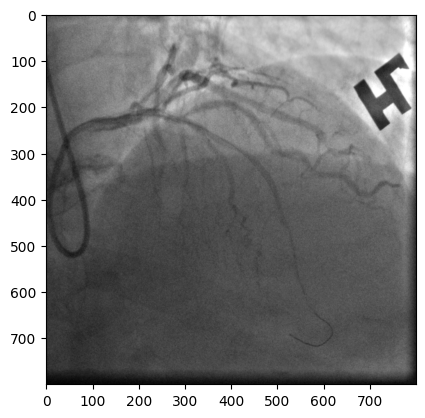

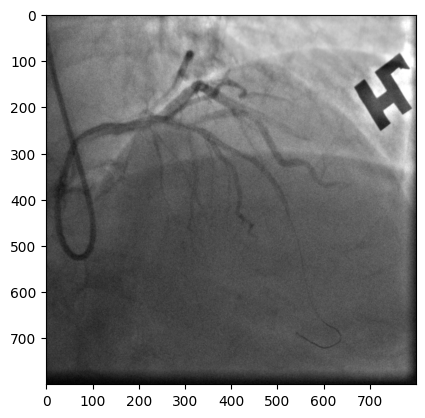

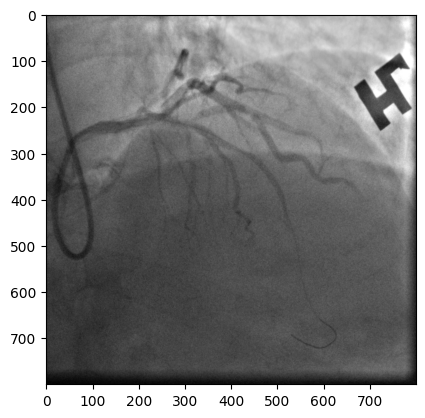

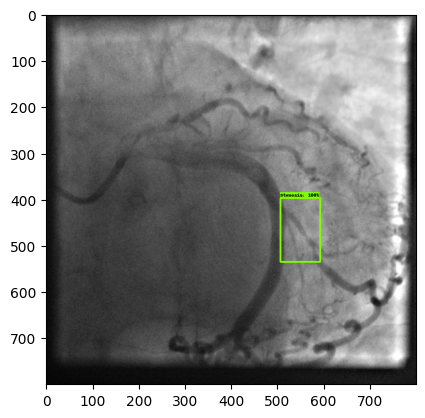

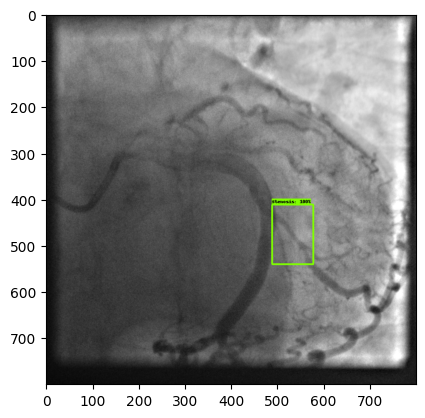

...

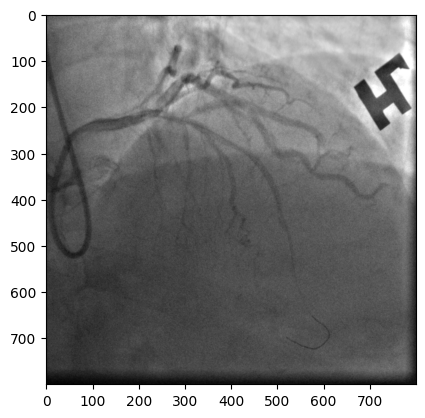

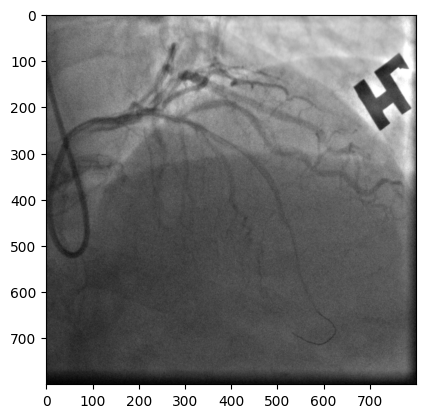

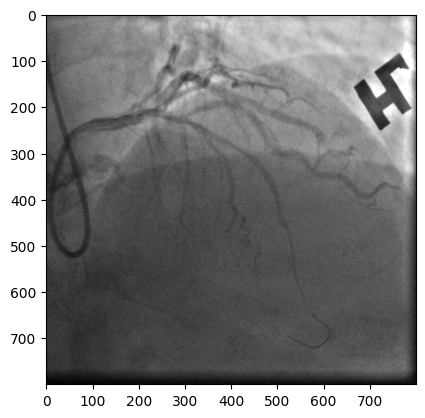

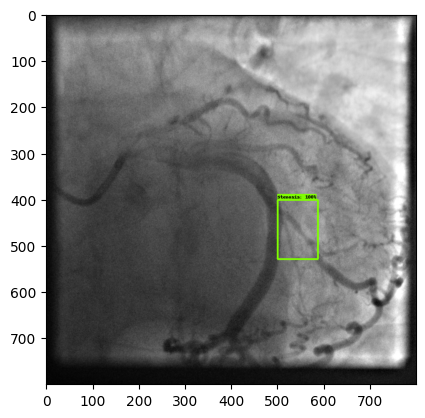

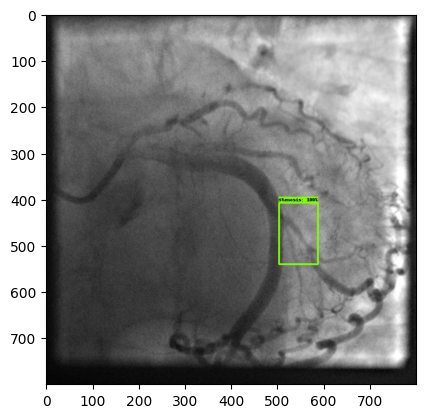

In [ ]:
#!/usr/bin/env python
# coding: utf-8
"""
Object Detection From TF2 Saved Model
=====================================
"""

# %%
# This demo will take you through the steps of running an "out-of-the-box" TensorFlow 2 compatible
# detection model on a collection of images. More specifically, in this example we will be using
# the `Saved Model Format <https://www.tensorflow.org/guide/saved_model>`__ to load the model.

# %%
# Download the test images
# ~~~~~~~~~~~~~~~~~~~~~~~~
# First we will download the images that we will use throughout this tutorial. The code snippet
# shown bellow will download the test images from the `TensorFlow Model Garden <https://github.com/tensorflow/models/tree/master/research/object_detection/test_images>`_
# and save them inside the ``data/images`` folder.
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'    # Suppress TensorFlow logging (1)
import pathlib
import tensorflow as tf

tf.get_logger().setLevel('ERROR')           # Suppress TensorFlow logging (2)


# %%
# Load the model
# ~~~~~~~~~~~~~~
# Next we load the downloaded model
import time
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as viz_utils

PATH_TO_MODEL_DIR = '/content/drive/MyDrive/200batch/1stset200/exportedmodels/my_effdetD2_feb27_200model'
PATH_TO_SAVED_MODEL = PATH_TO_MODEL_DIR + "/saved_model"

print('Loading model...', end='')
start_time = time.time()

# Load saved model and build the detection function
detect_fn = tf.saved_model.load(PATH_TO_SAVED_MODEL)

end_time = time.time()
elapsed_time = end_time - start_time
print('Done! Took {} seconds'.format(elapsed_time))

# %%
# Load label map data (for plotting)
# ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
# Label maps correspond index numbers to category names, so that when our convolution network
# predicts `5`, we know that this corresponds to `airplane`.  Here we use internal utility
# functions, but anything that returns a dictionary mapping integers to appropriate string labels
# would be fine.
PATH_TO_LABELS = '/content/drive/MyDrive/capstone_final_sub-dataset200_codefolder/stenosis/TensorFlow/workspace/training_demo/annotations/label_map.pbtxt'
category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS,
                                                                    use_display_name=True)

# %%
# Putting everything together
# ~~~~~~~~~~~~~~~~~~~~~~~~~~~
# The code shown below loads an image, runs it through the detection model and visualizes the
# detection results, including the keypoints.
#
# Note that this will take a long time (several minutes) the first time you run this code due to
# tf.function's trace-compilation --- on subsequent runs (e.g. on new images), things will be
# faster.
#
# Here are some simple things to try out if you are curious:
#
# * Modify some of the input images and see if detection still works. Some simple things to try out here (just uncomment the relevant portions of code) include flipping the image horizontally, or converting to grayscale (note that we still expect the input image to have 3 channels).
# * Print out `detections['detection_boxes']` and try to match the box locations to the boxes in the image.  Notice that coordinates are given in normalized form (i.e., in the interval [0, 1]).
# * Set ``min_score_thresh`` to other values (between 0 and 1) to allow more detections in or to filter out more detections.
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')   # Suppress Matplotlib warnings

def load_image_into_numpy_array(path):
    """Load an image from file into a numpy array.

    Puts image into numpy array to feed into tensorflow graph.
    Note that by convention we put it into a numpy array with shape
    (height, width, channels), where channels=3 for RGB.

    Args:
      path: the file path to the image

    Returns:
      uint8 numpy array with shape (img_height, img_width, 3)
    """
    return np.array(Image.open(path))


IMAGE_PATHS = '/content/drive/MyDrive/capstone_final_sub-dataset200_codefolder/stenosis/TensorFlow/workspace/training_demo/images/test/'



from matplotlib import pyplot as plt
import cv2
%matplotlib inline

final_boxes_list = []  # Create an empty list to store all final box values

for image_path in IMAGE_PATHS:

    print('Running inference for {}... '.format(image_path), end='')

    im_width, im_height = (Image.open(image_path).size)
    image_np = load_image_into_numpy_array(image_path)

    # The input needs to be a tensor, convert it using `tf.convert_to_tensor`.
    input_tensor = tf.convert_to_tensor(image_np)
    # The model expects a batch of images, so add an axis with `tf.newaxis`.
    input_tensor = input_tensor[tf.newaxis, ...]

    # input_tensor = np.expand_dims(image_np, 0)
    detections = detect_fn(input_tensor)

    # All outputs are batches tensors.
    # Convert to numpy arrays, and take index [0] to remove the batch dimension.
    # We're only interested in the first num_detections.
    num_detections = int(detections.pop('num_detections'))
    detections = {key: value[0, :num_detections].numpy()
                   for key, value in detections.items()}
    detections['num_detections'] = num_detections

    # detection_classes should be ints.
    detections['detection_classes'] = detections['detection_classes'].astype(np.int64)

    image_np_with_detections = image_np.copy()

    viz_utils.visualize_boxes_and_labels_on_image_array(
          image_np_with_detections,
          detections['detection_boxes'],
          detections['detection_classes'],
          detections['detection_scores'],
          category_index,
          use_normalized_coordinates=True,
          max_boxes_to_draw=200,
          min_score_thresh=.30,
          agnostic_mode=False)



    # Draw the detection results on the image
    plt.figure()
    plt.imshow(image_np_with_detections, cmap='gray')
    print('Done')

    boxes = np.squeeze(detections['detection_boxes'])
    scores = np.squeeze(detections['detection_scores'])
    #set a min thresh score, say 0.3
    min_score_thresh = 0.3
    bboxes = boxes[scores > min_score_thresh]


    final_box = []
    for box in bboxes:
        ymin, xmin, ymax, xmax = box
        final_box.append([xmin * im_width, xmax * im_width, ymin * im_height, ymax * im_height])

    final_boxes_list.append(final_box)  # Append the final box values for the current image to the list

    print("Final box value:")
    print(final_box)


In [ ]:
print(final_boxes_list)

[[], [], [], [[506.8099021911621, 593.1756973266602, 398.98462295532227, 535.4317665100098]], [[488.50035667419434, 578.5646915435791, 412.0493412017822, 540.7657146453857]], [[484.4322204589844, 573.1945991516113, 408.3158493041992, 533.8237762451172]], [], [], [[504.99119758605957, 590.6674861907959, 402.59060859680176, 540.4042720794678]], [[494.7552680969238, 583.4010124206543, 403.25894355773926, 530.7775974273682]], [[485.8945846557617, 575.7528305053711, 413.9087200164795, 538.5202884674072]], [[503.5756587982178, 587.3852252960205, 411.89351081848145, 541.0879611968994]], [], [[486.2921714782715, 576.123046875, 413.3204460144043, 537.8421783447266]], [], [], [], [], [[500.9923458099365, 588.9489650726318, 402.6486873626709, 529.6627521514893]], [[503.8698673248291, 588.684606552124, 408.09054374694824, 540.3234958648682]]]


In [ ]:
predcord = final_boxes_list

In [ ]:
# Output list
merged_predcord = []

for sublist in predcord:
    # Skip empty sublists
    if not sublist:
        merged_predcord.append([])
        continue

    # Merge bounding boxes within the sublist
    merged_boxes = []
    for box in sublist:
        xmin, xmax, ymin, ymax = box
        merged_boxes.append([xmin, ymin, xmax, ymax])

    merged_predcord.append(merged_boxes)

# Print or use the merged_predcord as needed
print(merged_predcord)

[[], [], [], [[506.8099021911621, 398.98462295532227, 593.1756973266602, 535.4317665100098]], [[488.50035667419434, 412.0493412017822, 578.5646915435791, 540.7657146453857]], [[484.4322204589844, 408.3158493041992, 573.1945991516113, 533.8237762451172]], [], [], [[504.99119758605957, 402.59060859680176, 590.6674861907959, 540.4042720794678]], [[494.7552680969238, 403.25894355773926, 583.4010124206543, 530.7775974273682]], [[485.8945846557617, 413.9087200164795, 575.7528305053711, 538.5202884674072]], [[503.5756587982178, 411.89351081848145, 587.3852252960205, 541.0879611968994]], [], [[486.2921714782715, 413.3204460144043, 576.123046875, 537.8421783447266]], [], [], [], [], [[500.9923458099365, 402.6486873626709, 588.9489650726318, 529.6627521514893]], [[503.8698673248291, 408.09054374694824, 588.684606552124, 540.3234958648682]]]


In [ ]:
predcord = merged_predcord

In [ ]:
print(predcord)

[[], [], [], [[506.8099021911621, 398.98462295532227, 593.1756973266602, 535.4317665100098]], [[488.50035667419434, 412.0493412017822, 578.5646915435791, 540.7657146453857]], [[484.4322204589844, 408.3158493041992, 573.1945991516113, 533.8237762451172]], [], [], [[504.99119758605957, 402.59060859680176, 590.6674861907959, 540.4042720794678]], [[494.7552680969238, 403.25894355773926, 583.4010124206543, 530.7775974273682]], [[485.8945846557617, 413.9087200164795, 575.7528305053711, 538.5202884674072]], [[503.5756587982178, 411.89351081848145, 587.3852252960205, 541.0879611968994]], [], [[486.2921714782715, 413.3204460144043, 576.123046875, 537.8421783447266]], [], [], [], [], [[500.9923458099365, 402.6486873626709, 588.9489650726318, 529.6627521514893]], [[503.8698673248291, 408.09054374694824, 588.684606552124, 540.3234958648682]]]


In [ ]:
predcord_int = [[[int(x) for x in sublist] for sublist in sublist_list] for sublist_list in predcord]

# Display the result
print(predcord_int)

[[], [], [], [[506, 398, 593, 535]], [[488, 412, 578, 540]], [[484, 408, 573, 533]], [], [], [[504, 402, 590, 540]], [[494, 403, 583, 530]], [[485, 413, 575, 538]], [[503, 411, 587, 541]], [], [[486, 413, 576, 537]], [], [], [], [], [[500, 402, 588, 529]], [[503, 408, 588, 540]]]


In [ ]:
len(predcord)

20

In [ ]:
class Detection:
    def __init__(self, filename, ground_truth, prediction):
        self.filename = filename
        self.ground_truth = ground_truth
        self.prediction = prediction

# Creating the examples list explicitly pairing each ground truth entry with its corresponding prediction
examples = [Detection(filename[0], filename[1], pred[0] if pred else []) for filename, pred in zip(filenameandgtruths, predcord_int)]

# Printing the result
for example in examples:
    print(f'Detection("/content/drive/MyDrive/capstone_final_sub-dataset200_codefolder/stenosis/TensorFlow/workspace/training_demo/images/test/{example.filename}", {example.ground_truth}, {example.prediction}),')

Detection("/content/drive/MyDrive/capstone_final_sub-dataset200_codefolder/stenosis/TensorFlow/workspace/training_demo/images/test/14_007_3_0035.bmp", [391, 181, 444, 221], []),
Detection("/content/drive/MyDrive/capstone_final_sub-dataset200_codefolder/stenosis/TensorFlow/workspace/training_demo/images/test/14_007_3_0030.bmp", [419, 203, 458, 242], []),
Detection("/content/drive/MyDrive/capstone_final_sub-dataset200_codefolder/stenosis/TensorFlow/workspace/training_demo/images/test/14_007_3_0031.bmp", [415, 190, 461, 234], []),
Detection("/content/drive/MyDrive/capstone_final_sub-dataset200_codefolder/stenosis/TensorFlow/workspace/training_demo/images/test/14_006_1_0146.bmp", [503, 388, 589, 528], [506, 398, 593, 535]),
Detection("/content/drive/MyDrive/capstone_final_sub-dataset200_codefolder/stenosis/TensorFlow/workspace/training_demo/images/test/14_006_1_0149.bmp", [484, 412, 574, 529], [488, 412, 578, 540]),
Detection("/content/drive/MyDrive/capstone_final_sub-dataset200_codefolder

Ground Truths in Green

Prediction in Blue


Ground Truth: (GREEN)
[503, 388, 589, 528]
Prediction: (BLUE)
[506, 398, 593, 535]

14_006_1_0146.bmp: IOU (Jaccard Index) = 0.8208
14_006_1_0146.bmp: Dice Coefficient (F1-Score) = 0.9016



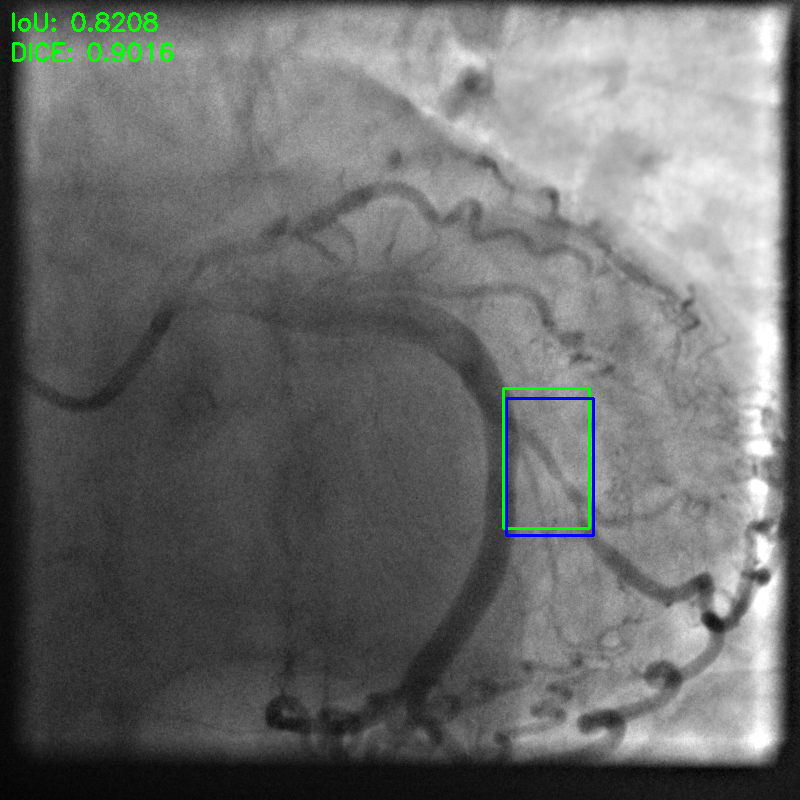


Ground Truth: (GREEN)
[484, 412, 574, 529]
Prediction: (BLUE)
[488, 412, 578, 540]

14_006_1_0149.bmp: IOU (Jaccard Index) = 0.8407
14_006_1_0149.bmp: Dice Coefficient (F1-Score) = 0.9135



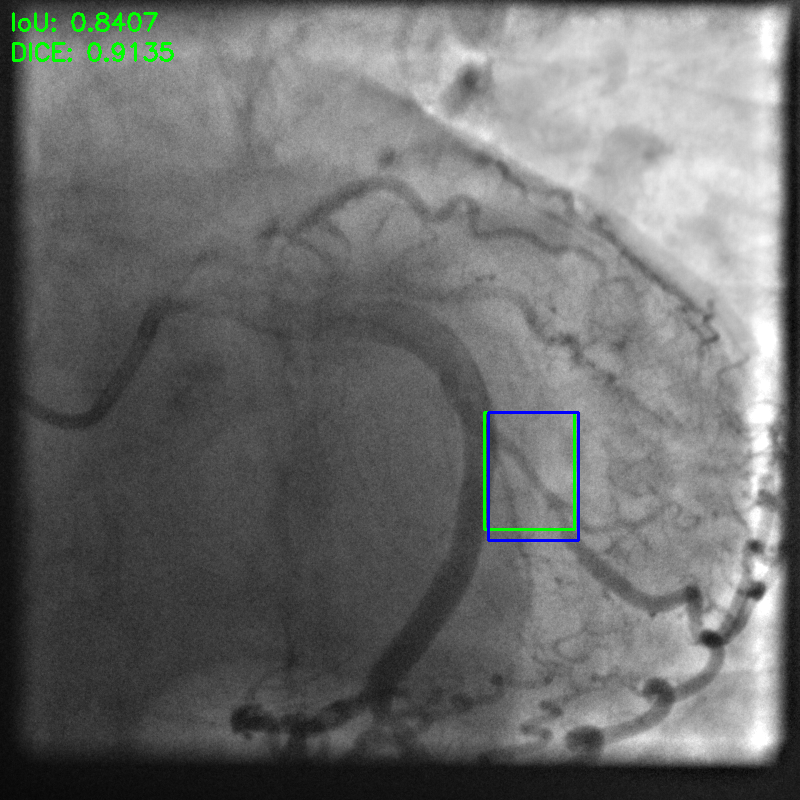


Ground Truth: (GREEN)
[480, 405, 574, 544]
Prediction: (BLUE)
[484, 408, 573, 533]

14_006_1_0152.bmp: IOU (Jaccard Index) = 0.8526
14_006_1_0152.bmp: Dice Coefficient (F1-Score) = 0.9205



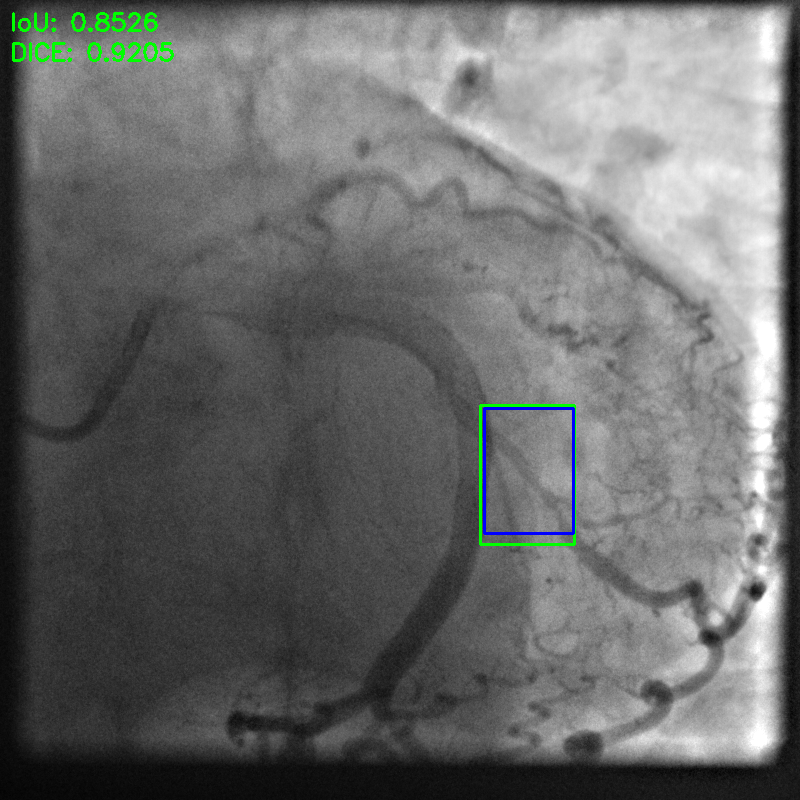


Ground Truth: (GREEN)
[509, 403, 589, 542]
Prediction: (BLUE)
[504, 402, 590, 540]

14_006_1_0145.bmp: IOU (Jaccard Index) = 0.9121
14_006_1_0145.bmp: Dice Coefficient (F1-Score) = 0.9540



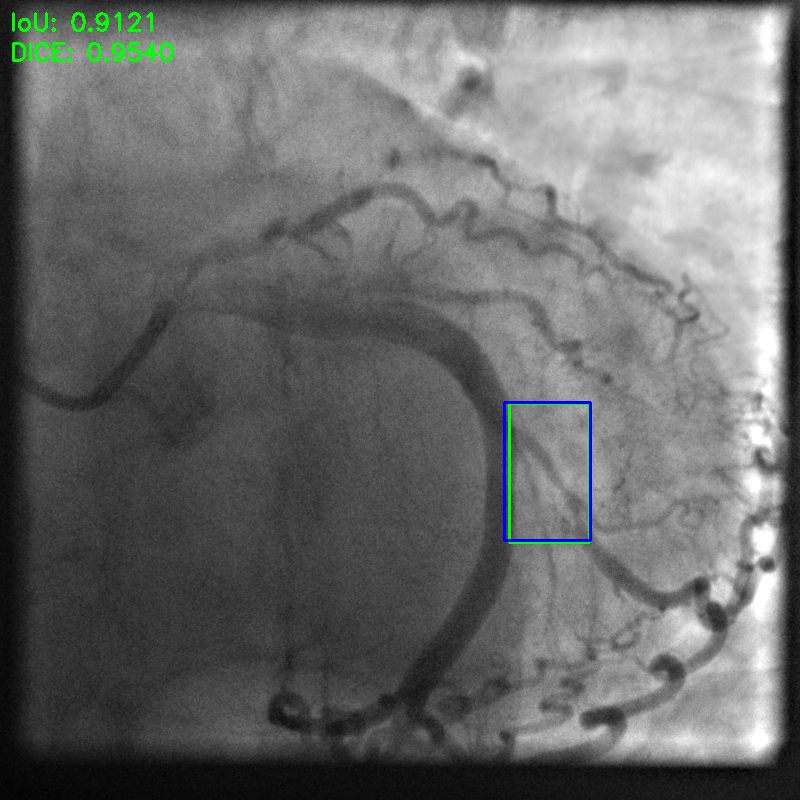


Ground Truth: (GREEN)
[492, 403, 586, 536]
Prediction: (BLUE)
[494, 403, 583, 530]

14_006_1_0148.bmp: IOU (Jaccard Index) = 0.9049
14_006_1_0148.bmp: Dice Coefficient (F1-Score) = 0.9501



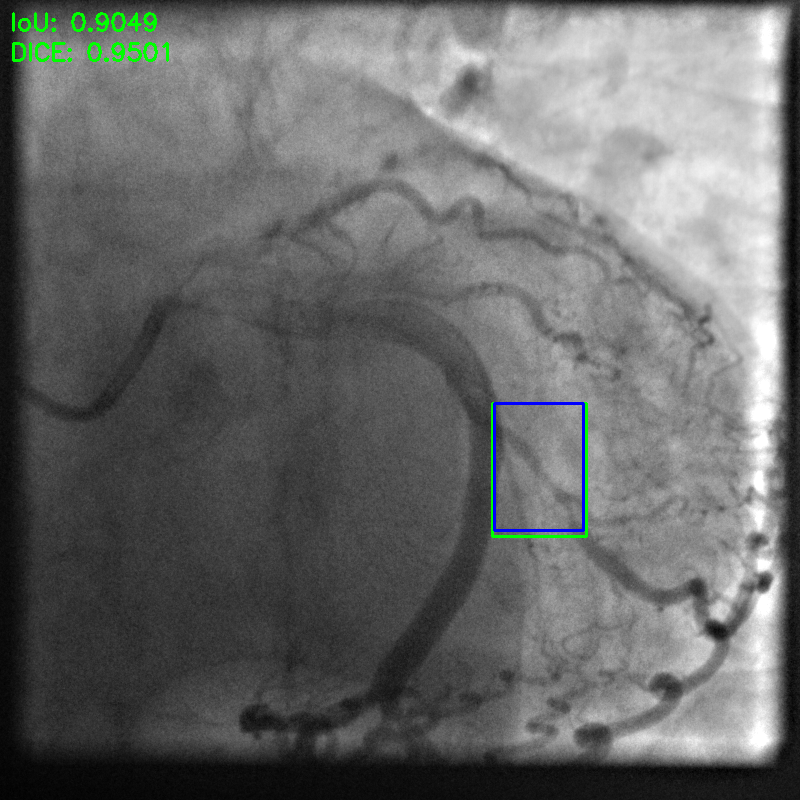


Ground Truth: (GREEN)
[485, 413, 574, 535]
Prediction: (BLUE)
[485, 413, 575, 538]

14_006_1_0151.bmp: IOU (Jaccard Index) = 0.9655
14_006_1_0151.bmp: Dice Coefficient (F1-Score) = 0.9824



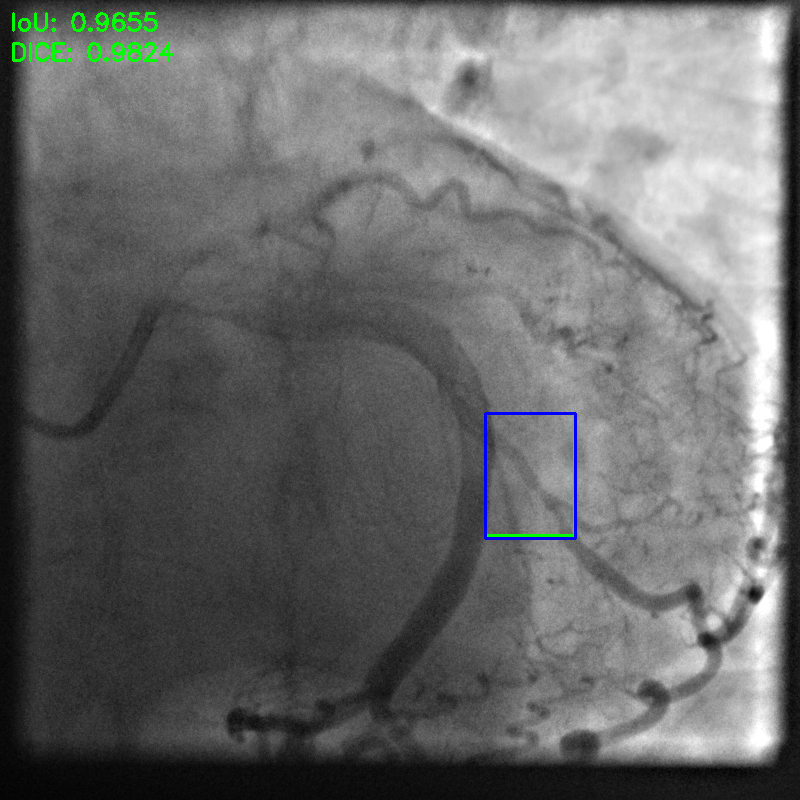


Ground Truth: (GREEN)
[510, 419, 592, 541]
Prediction: (BLUE)
[503, 411, 587, 541]

14_006_1_0143.bmp: IOU (Jaccard Index) = 0.8165
14_006_1_0143.bmp: Dice Coefficient (F1-Score) = 0.8990



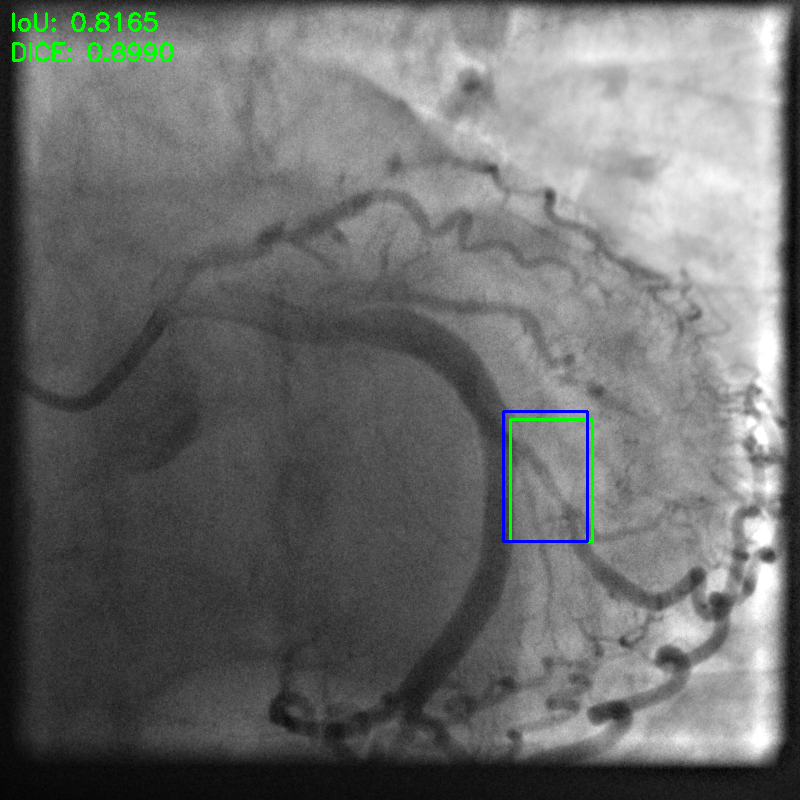


Ground Truth: (GREEN)
[473, 396, 579, 536]
Prediction: (BLUE)
[486, 413, 576, 537]

14_006_1_0150.bmp: IOU (Jaccard Index) = 0.7434
14_006_1_0150.bmp: Dice Coefficient (F1-Score) = 0.8528



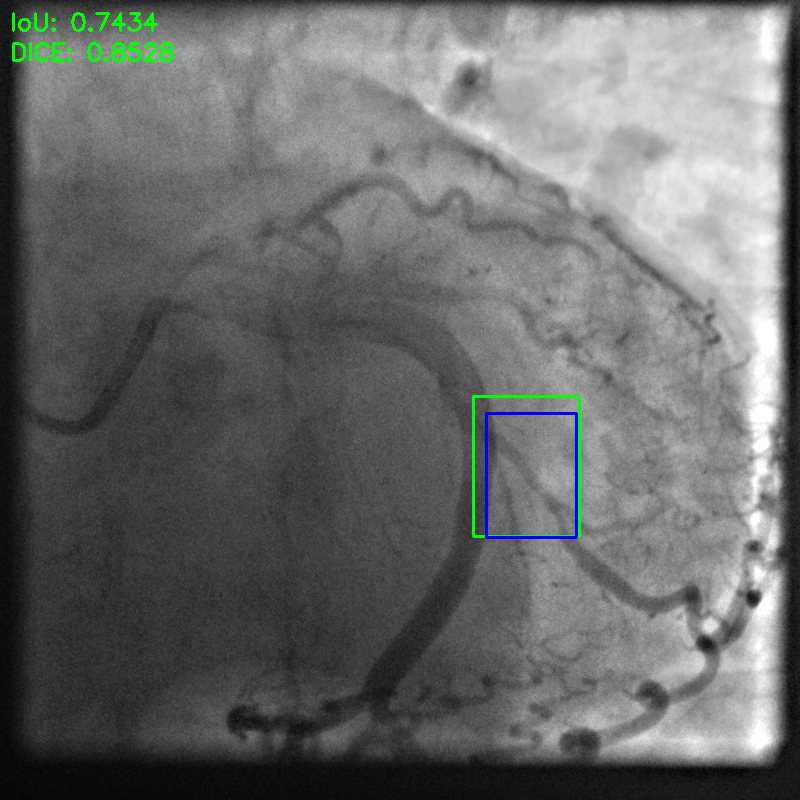


Ground Truth: (GREEN)
[505, 397, 589, 527]
Prediction: (BLUE)
[500, 402, 588, 529]

14_006_1_0147.bmp: IOU (Jaccard Index) = 0.8862
14_006_1_0147.bmp: Dice Coefficient (F1-Score) = 0.9397



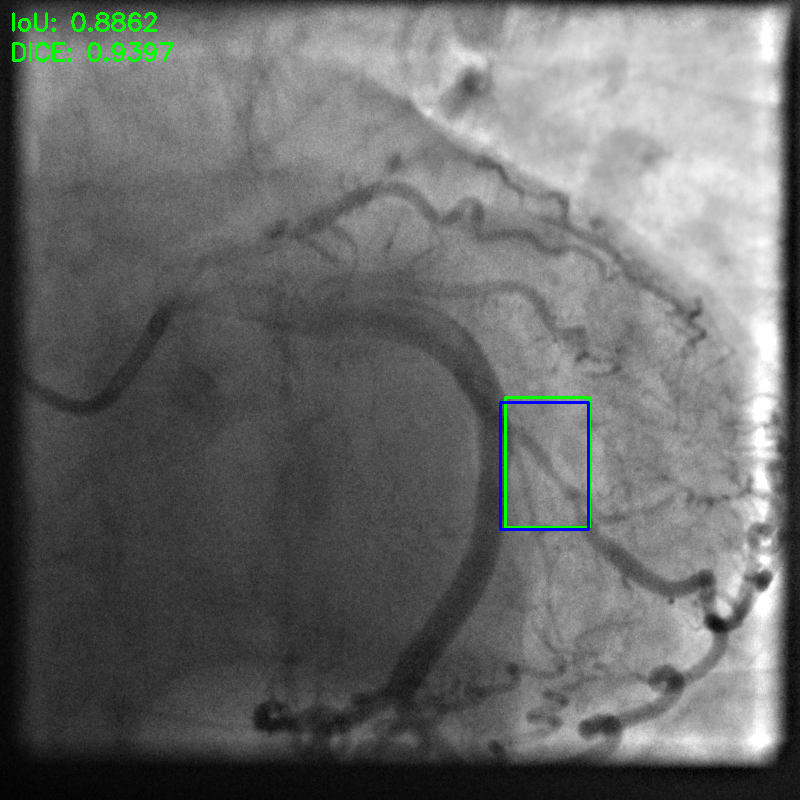


Ground Truth: (GREEN)
[493, 399, 592, 525]
Prediction: (BLUE)
[503, 408, 588, 540]

14_006_1_0144.bmp: IOU (Jaccard Index) = 0.7254
14_006_1_0144.bmp: Dice Coefficient (F1-Score) = 0.8408



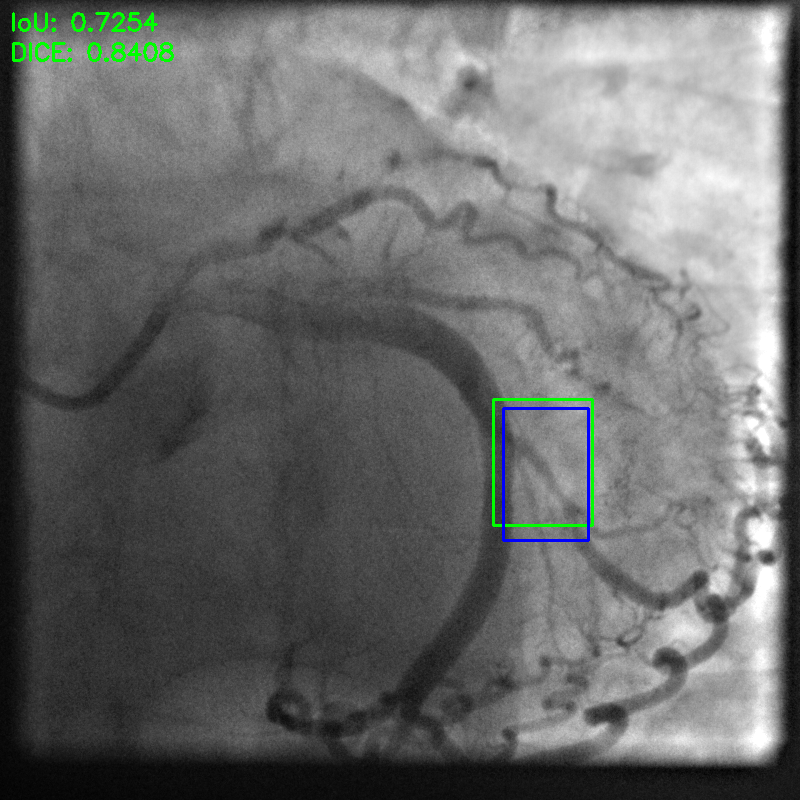

Average IOU: 0.8468183648210665
Average DICE: 0.9154390672626078


In [ ]:
from google.colab.patches import cv2_imshow

total_iou = 0
total_dice = 0
num_detections = 0

# loop over the example detections if there is a prediction
for detection in examples:
    # load the image
  if detection.prediction:
    image = cv2.imread("/content/drive/MyDrive/capstone_final_sub-dataset200_codefolder/stenosis/TensorFlow/workspace/training_demo/images/test/"+detection.filename)
    cv2.rectangle(image, tuple(detection.ground_truth[:2]), tuple(detection.ground_truth[2:]), (0,255,0), 2)
    print()
    print("Ground Truth: (GREEN)")
    print(detection.ground_truth)
    print("Prediction: (BLUE)")
    print(detection.prediction)
    cv2.rectangle(image, tuple(detection.prediction[:2]), tuple(detection.prediction[2:]), (255,0,0), 2)

    # compute the intersection over union and display it
    iou = bb_intersection_over_union(detection.ground_truth, detection.prediction)
    total_iou += iou
    num_detections += 1
    cv2.putText(image, "IoU: {:.4f}".format(iou), (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 0), 2)
    print()
    print("{}: IOU (Jaccard Index) = {:.4f}".format(detection.filename, iou))
    # compute the dice coefficient and display it
    dice = bb_dice(detection.ground_truth, detection.prediction)
    total_dice += dice
    cv2.putText(image, "DICE: {:.4f}".format(dice), (10, 60), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 0), 2)
    print("{}: Dice Coefficient (F1-Score) = {:.4f}".format(detection.filename, dice))

    print()
    if(iou and dice >0):
      # show the output image
      cv2_imshow(image)

# Calculate the average IOU
average_iou = total_iou / num_detections
print("Average IOU:", average_iou)

# Calculate the average DICE
average_dice = total_dice / num_detections
print("Average DICE:", average_dice)

